In [1]:
require(data.table)
require(MASS)
require(ggplot2)
options(repr.plot.width = 30, repr.plot.height = 15, repr.plot.res = 300)

d = fread('./figures/zebrafish_farrell2018.graphdr.txt',sep='\t')

anno = fread('./data/other/farrell_2018.anno',sep='\t')
anno = anno[2:dim(anno)[1],]
anno = anno[match(d$V1,anno$NAME),]

anno$ectoderm  = rowSums(as.matrix(anno[,4:15,with=F])=="TRUE")>0
anno$othermesendoderm  = rowSums(as.matrix(anno[,16:24,with=F])=="TRUE")>0
anno$axialmesoderm  = rowSums(as.matrix(anno[,25:26,with=F])=="TRUE")>0

anno$level1=NA
anno$level1[anno$ectoderm & ! anno$othermesendoderm & !anno$axialmesoderm] = "Ectoderm"
anno$level1[!anno$ectoderm &  anno$othermesendoderm & !anno$axialmesoderm] = "Other mesendoderm"
anno$level1[!anno$ectoderm & ! anno$othermesendoderm & anno$axialmesoderm] = "Axial mesoderm"

anno$neuroectoderm  = rowSums(as.matrix(anno[,4:10,with=F])=="TRUE")>0
anno$nonneuroectoderm  = rowSums(as.matrix(anno[,11:15,with=F])=="TRUE")>0
anno$level2=anno$level1
anno$level2[anno$neuroectoderm & ! anno$nonneuroectoderm] = "Neurectoderm"
anno$level2[anno$level2=='Ectoderm'] = "Other ectoderm"


anno$paraxialmesoderm = anno$Lineage_Tailbud=="TRUE" | anno$Lineage_Somites=="TRUE"  | anno$Lineage_Adaxial_Cells=="TRUE" 
anno$endoderm = anno$Lineage_Endoderm_Pharyngeal =="TRUE" | anno$Lineage_Endoderm_Pancreatic_Intestinal=="TRUE" 
anno$intermediatemesoderm = anno$Lineage_Hematopoeitic_ICM =="TRUE" |  anno$Lineage_Hematopoeitic_RBI_Pronephros=="TRUE"
anno$lateralmesoderm = anno$Lineage_Cephalic_Mesoderm =="TRUE" |  anno$Lineage_Heart_Primordium=="TRUE"

anno$level3=anno$level2
anno$level3[anno$paraxialmesoderm & !anno$endoderm & !anno$intermediatemesoderm & !anno$lateralmesoderm] = "Paraxial mesoderm"
anno$level3[!anno$paraxialmesoderm & anno$endoderm & !anno$intermediatemesoderm & !anno$lateralmesoderm] = "Endoderm"
anno$level3[!anno$paraxialmesoderm & !anno$endoderm & anno$intermediatemesoderm & !anno$lateralmesoderm] = "Intermediate mesoderm"
anno$level3[!anno$paraxialmesoderm & !anno$endoderm & !anno$intermediatemesoderm & anno$lateralmesoderm] = "Lateral mesoderm"


plotdata= data.frame(x=-d$D0,y=d$D1,z=d$D2,stage=anno$Stage, level1= anno$level1, level2= anno$level2, level3= anno$level3)
plotdata = plotdata[order(-plotdata$z),]

Loading required package: data.table
Loading required package: MASS
Loading required package: ggplot2
Warning message in fread("./figures/zebrafish_farrell2018.graphdr.txt", sep = "\t"):
“Detected 50 column names but the data has 51 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”

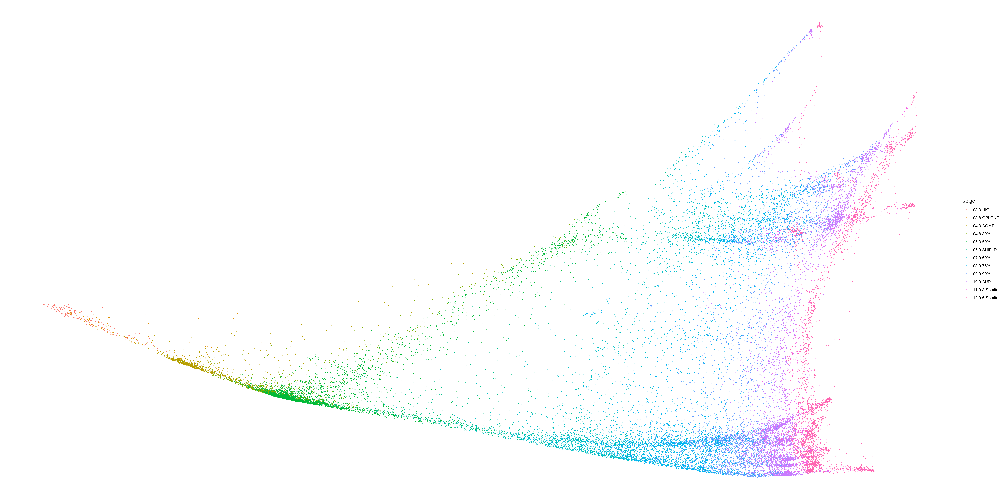

In [2]:
ggplot(plotdata,mapping=aes(x=x,y=y,color=stage))+geom_point(size=I(0.05),alpha=I(1))+theme_void()
ggsave('./figures/zebrafish_farrell2018.pdf',width=20,height=10,useDingbats=F)


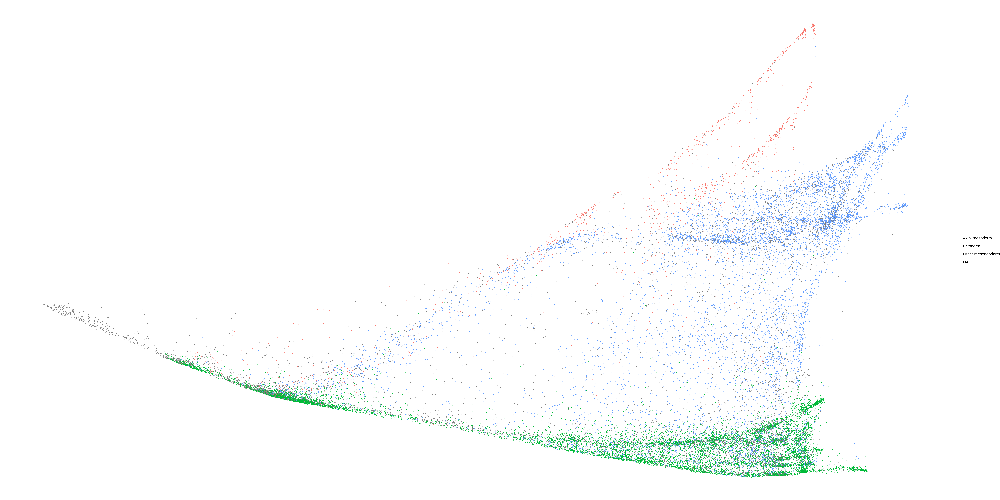

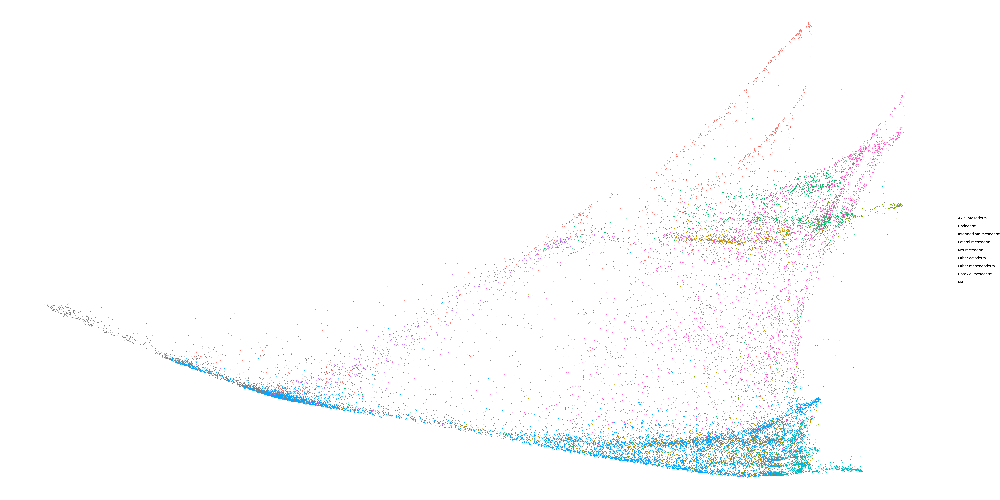

In [3]:
ggplot(plotdata,mapping=aes(x=x,y=y,color=level1))+geom_point(size=I(0.05),alpha=I(1))+theme_void()+theme(legend.title=element_blank())
ggsave('./figures/zebrafish_farrell2018.level1.pdf',width=20,height=10,useDingbats=F)
ggplot(plotdata,mapping=aes(x=x,y=y,color=level3))+geom_point(size=I(0.05),alpha=I(1))+theme_void()+theme(legend.title=element_blank())
ggsave('./figures/zebrafish_farrell2018.level3.pdf',width=20,height=10,useDingbats=F)

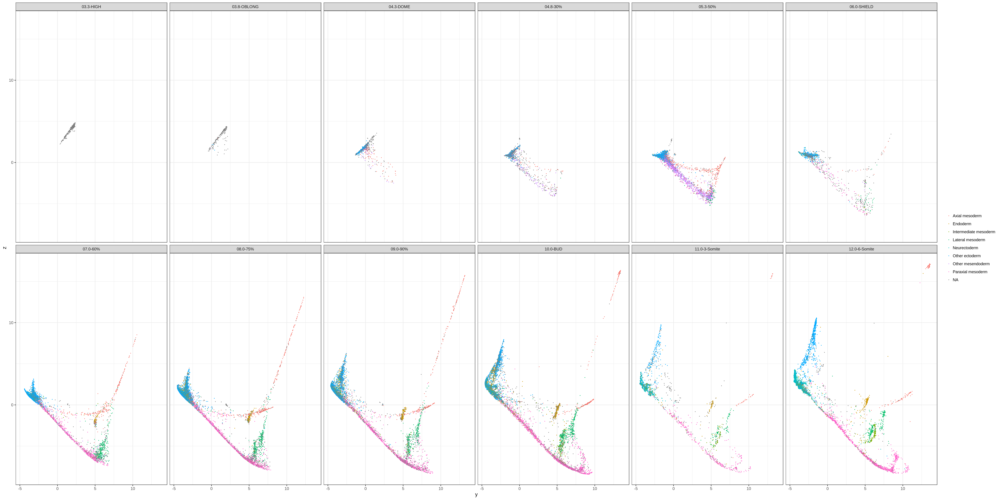

In [4]:
ggplot(plotdata,mapping=aes(x=y,y=z,color=level3))+geom_point(size=I(0.05),alpha=I(1))+theme_bw()+facet_wrap(~stage,nrow = 2)+theme(legend.title=element_blank())
ggsave('./figures/zebrafish_farrell2018.split.level3.pdf',width=45,height=22.5,useDingbats=F)